# Intro

Установка необходимым зависимостей:

In [1]:
!pip install numpy matplotlib requests

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import requests
from os import mkdir
from os.path import basename, isdir

def download(url, location='.'):
    response = requests.get(url)
    if response.status_code != 200:
        raise IOError(f"response statis code is {response.status_code}")

    if not isdir(location):
        mkdir(location)

    path = location + '/' + basename(url)
    with open(path, "wb") as file:
        file.write(response.content)

    print(f'The file is successfully downloaded with path: \n{path}')

# загрузка модуля plot_tools:
url = "https://raw.githubusercontent.com/ordevoir/Miscellaneous/master/plot_tools.py"
download(url)

from plot_tools import show_image, show_images

The file is successfully downloaded with path: 
./plot_tools.py


## Загрузка изображения

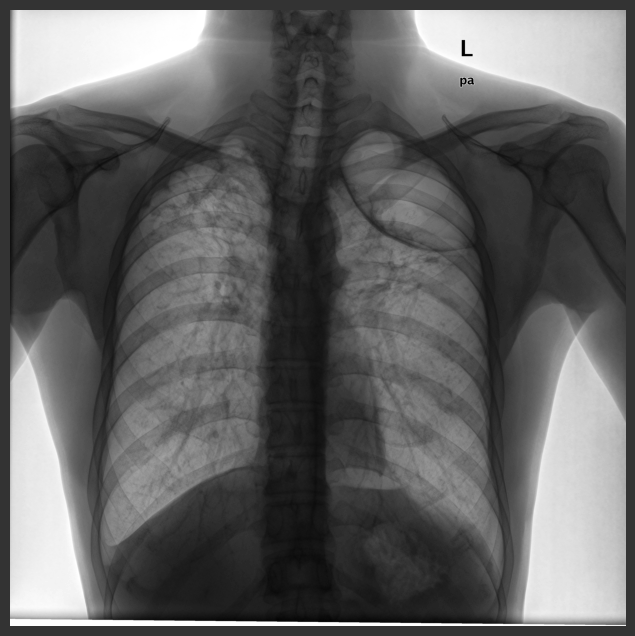

In [8]:
MAX_INTENSITY = 2**16 - 1 
HEIGHT, WIDTH = 2999, 2996

source_img = np.fromfile("images/image_16bit_(2999x2996).raw", dtype=np.uint16)
source_img = source_img.reshape(HEIGHT, WIDTH)
show_image(source_img)

# Look Up Table

Look Up Table (LUT) представляет собой таблицу соответствий для преобразования интенсивностей пикселей. LUT может быть представлен в виде последовательности целых положительных чисел длины 65536. Значения элементов последовательности варьируются в диапазоне [0, 65535]. Преобразование изображения с использованием LUT производит попиксельное изменение исходного изображения, при котором исходное значение каждого пикселя заменяется значением из таблицы: индекс элемента последовательности соответствует интенсивности пикселя в исходном изображении, а значение по индексу определяет интенсивность пикселя результирующего изображения. Пусть `L` – переменная, содержащая LUT, а `I` – переменная, содержащая монохромное изображение в виде двумерного массива. Тогда, если к примеру, значение интенсивности `I[i,j]` пикселя с координатами `i`, `j` равно `1000`, то в значения пикселя с координатами `i`, `j` результирующего изображения будет равно `L[1000]`.

LUT является табличным представлением некоторой функции $f(x)$ от одной переменной. Область определения функции – $[0, 65535]$, область значения функции может содержать значения только в пределах диапазона $[0, 65535]$. Таким образом, применение LUT тождественно преобразованию каждого пикселя соответствующей функцией. Значение пикселя результирующего изображения определяется *только* значением пикселя исходного изображения, в отличие, от ядерных фильтров, в которых новое значение зависит также и от значений соседних пикселей. 

Применение LUT вместо функции преобразования существенно увеличивает производительность за счет сокращения вычислений. При преобразовании пикселей при помощи функции, необходимо вызвать функцию для каждого пикселя изображения. Если, к примеру, необходимо преобразовать изображение, с размером $1000 \times 1000$, то необходимо произвести вызов функции $10^6$ раз. Если используется LUT для преобразования, то необходимо произвести $10^6$ раз замену значения, что может быть существенно дешевле, чем вызов функции. Для генерации LUT необходимо вызвать функцию $65536$ раз, и далее использовать ее для преобразования неограниченного числа изображений. 


# Gamma Correction

В качестве примера, рассмотрим гамма-коррекцию. Для того, чтобы произвести гамма-коррекцию, необходимо применить следующую функцию к каждому пикселю изображения:

$$
r = m \left(\frac{s}{m} \right)^{\frac{1}{\gamma}}
$$

где $s$ – значение интенсивности данного пикселя исходного изображения (*sourсe*), $r$ – значение интенсивности данного пикселя результирующего изображения (*result*), $m$ – максимальное значение интенсивности.

Создадим функцию, которая возвращает преобразованное изображение:

In [3]:
def gamma_correction(img, gamma=1.2):
    m = MAX_INTENSITY
    power = 1.0 / gamma
    return m * ((img / m) ** power)

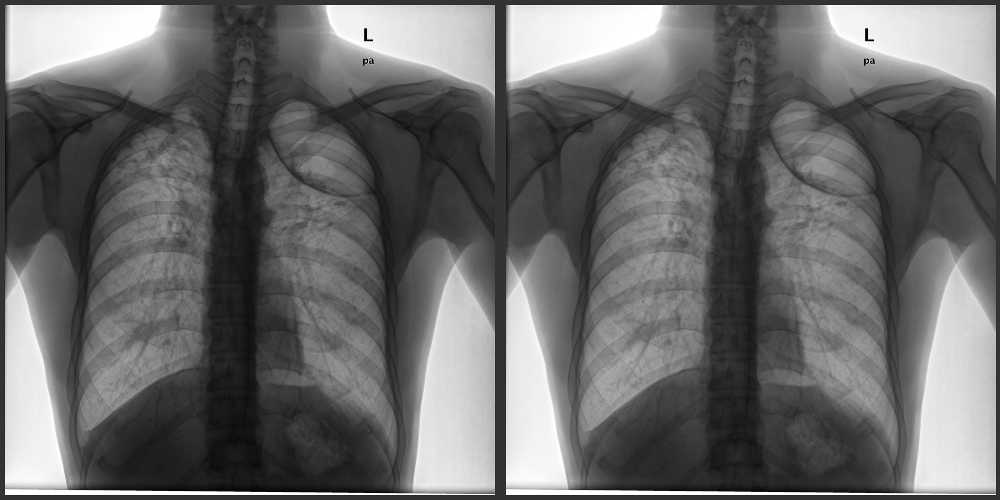

In [4]:
result_img = gamma_correction(source_img)

show_images([source_img, result_img], size=10)

Теперь создадим функцию, которая возвращает таблицу преобразований (LUT):

In [5]:
def get_gamma_correction_lut(gamma=1.2):
    m = MAX_INTENSITY
    power = 1.0 / gamma
    identical = np.arange(MAX_INTENSITY+1)
    lut = m * (identical / m) ** (power)
    return lut.astype(np.uint16)

Создадим таблицу со значением параметра $\gamma = 1.5$:

In [6]:
gamma_lut = get_gamma_correction_lut(gamma=1.5)
gamma_lut

array([    0,    40,    63, ..., 65533, 65534, 65535], dtype=uint16)

Получить новое изображение можно заменяя интенсивность каждого пикселя на соответствующее значение из `gamma_lut`:

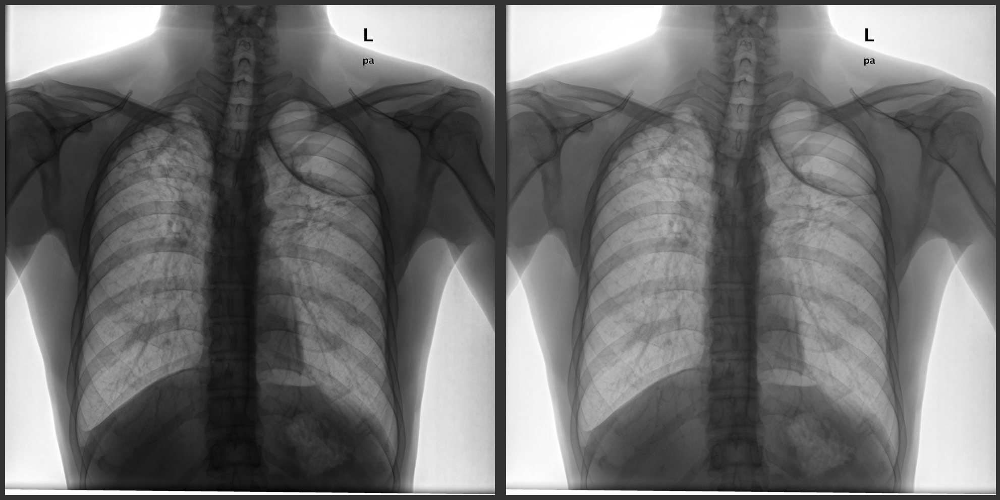

In [9]:
result_img_2 = source_img.copy()

for i in range(HEIGHT):
    for j in range(WIDTH):
        intensity = source_img[i, j]
        result_img_2[i, j] = gamma_lut[intensity]

show_images([source_img, result_img_2], size=10)

Python позволяет произвести эту операцию в одну строчку. Данный способ работает быстрее.

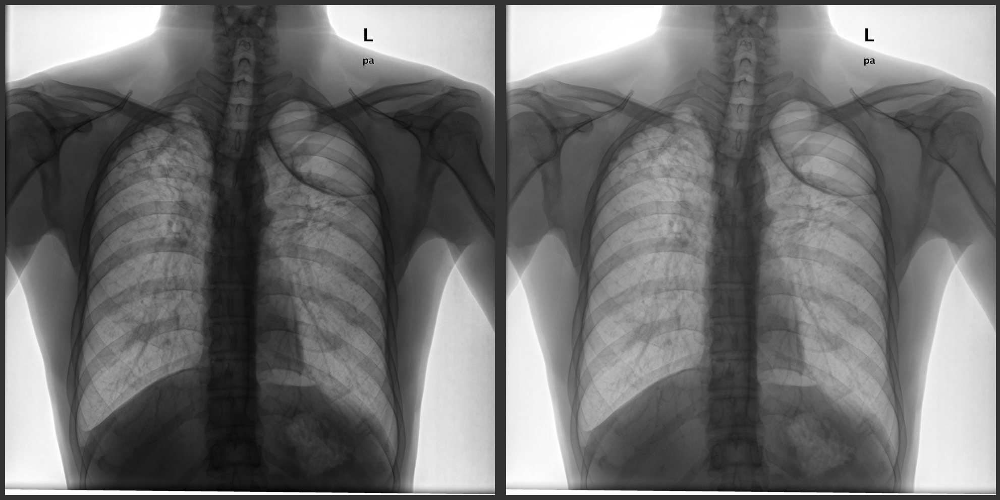

In [10]:
result_img_2 = gamma_lut[source_img]

show_images([source_img, result_img_2], size=10)

Визуализируем LUT, получаемый для гамма коррекции. Прямая пунктирная линия соответствует  тождественному преобразованию (*identical*), при котором изображение не изменяется.

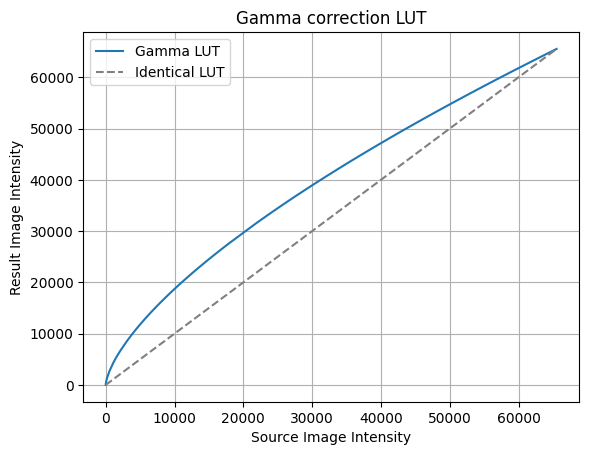

In [11]:
xs = np.arange(MAX_INTENSITY+1)

plt.title("Gamma correction LUT")
plt.plot(xs, gamma_lut, label="Gamma LUT")
plt.plot(xs, xs, "--", c="gray", label="Identical LUT")
plt.xlabel("Source Image Intensity")
plt.ylabel("Result Image Intensity")
plt.legend()
plt.grid()

# LUT generation

Определяются вспомогательные функции:

In [15]:
def get_xs(dot_count=None, to_int=False):
    if dot_count is None:
        dot_count = 2**16
    xs = np.empty(dot_count, dtype=np.float32)
    step = 1 / (dot_count)
    for i in range(dot_count):
        xs[i] = i * step
    return (xs * (2**16)).astype(np.uint16) if to_int else xs

def sigmoid(x, alpha=10., shift_x=0.0):
    return 1 / ( 1 + np.exp(-(x-shift_x) * alpha))

def logit(y, alpha, shift_x=0.0):
    return shift_x - np.log(y/(1-y)) / alpha

def get_ys_by_deriv(deriv, alpha):
    """Функция возвращает пару значений y1, y2, при которых сигмоида,
      с заданным значением alpha, итеет производную, равную deriv;
      если функция не имеет точек с производной deriv, возвращается -1 """
    D = 1 - 4 * deriv / alpha
    if D < 0:
        return -1
    y1 = (1 - np.sqrt(D)) / 2
    y2 = (1 + np.sqrt(D)) / 2
    return y1, y2

def get_max_deriv_by_alpha(alpha):
    return 0.25 * alpha

def get_min_alpha_by_deriv(d):
    return 4*d

def linear(x, k, shift_x=0, shift_y=0):
    return k * (x - shift_x) + shift_y

def inverse_linear(y, k, shift_x=0, shift_y=0):
    return (y - shift_y) / k + shift_x

In [16]:
def get_smooth_growth(span, shift, alpha, center=0.5):
    deriv = 1 / span
    shift_x = shift + center
    min_alpha = get_min_alpha_by_deriv(deriv)
    if alpha < min_alpha:
        alpha = min_alpha 
        print(f"warning: too small alpha for given span; the value {alpha = } is set!")
    y1, y2 = get_ys_by_deriv(deriv, alpha)
    x1, x2 = logit(y1, alpha, shift_x), logit(y2, alpha, shift_x)
    x_lin_1 = inverse_linear(y1, deriv, shift_x, shift_y=0.5)
    dx = float(x_lin_1 - x2)

    if x2+dx < 0.0:
        index_1 = 0
    elif x2+dx >= 1.0:
        index_1 = 2**16
    else:
        index_1 = int((x2+dx) * 2**16)

    if x1-dx < 0.0:
        index_2 = 0
    elif x1-dx >= 1.0:
        index_2 = 2**16 
    else:  
        index_2 = int((x1-dx) * 2**16)
    identical = get_xs()

    identical[:index_1] = sigmoid(identical[:index_1], alpha, shift_x+dx)            # левый кусок функции
    identical[index_1: index_2] = linear(identical[index_1: index_2], 
                                  deriv, shift_x, shift_y=0.5)  # центральный кусок функции
    identical[index_2:] = sigmoid(identical[index_2:], alpha, shift_x-dx)            # правый кусок функции
    return identical

Определение основной функции:

In [17]:
def make_lut(span=0.2, shift=0., smoothness=0.5, strength=1.0):
    min_alpha = get_min_alpha_by_deriv(1 / span)
    max_alpha = 200
    alpha = max_alpha - (max_alpha - min_alpha) * np.sqrt(smoothness)
    
    identical = get_xs()
    ys  = get_smooth_growth(span, shift, alpha) * strength * 10 * (span**2)
    lut = (identical + ys)
    lut = lut * (2**16-1) / lut.max()
    return lut.astype(np.uint16)

Функция `make_lut()` возвращает  массив, содержащий LUT, в соответствии с заданными параметрами. Для того, чтобы рассмотреть роль параметров, визуализируем сгенерированный по дефолтным значениям LUT:

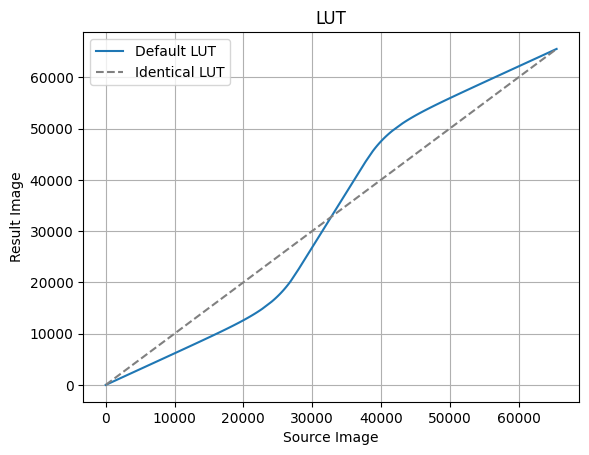

In [18]:
xs = np.arange(MAX_INTENSITY+1)
ys = make_lut(span=.25, shift=0., smoothness=0.9, strength=1.)
plt.title("LUT")
plt.plot(xs, ys, label="Default LUT")
plt.plot(xs, xs, "--", c="gray", label="Identical LUT")
plt.legend()
plt.xlabel("Source Image")
plt.ylabel("Result Image")
plt.grid()

Данный LUT позволит растянуть динамический диапазон интенсивностей, лежащих в диапазоне ~[25000, 40000] на диапазон [15000, 50000]. При этом динамический диапазон остальных диапазонов уменьшается. Меняя параметры, можно смещать область крутого подъема, увеличивать его ширину, сглаженность, и крутизну подъема, достигая расширения динамического диапазона на нужном участке.

- `span` – ширина крутого подъема (`0.05 - 0.5`);
- `shift` – смещение участка подъема (`-0.5 – 0.5`, отрицательные значения смещают влево, положительные вправо);
- `smoothness` – сглаженность переходов (`0.0 – 1.0`);
- `strength` – выраженность преобразования (`0.1 – 10.0`).

>Данная функция идентична функции `MakeLUT()` библиотеки.

# Примеры использования

Для удобства определим функцию, для визуализации LUT:

In [19]:
def show_lut(lut):
    xs = np.arange(MAX_INTENSITY+1)
    plt.plot(xs, lut, label="LUT")
    plt.plot(xs, xs, "--", c="gray", label="Identical LUT")
    plt.title("LUT")
    plt.xlabel("Source Image")
    plt.ylabel("Result Image")
    plt.legend()
    plt.grid()

Определим функцию, возращающую результирующее изображение, после применения LUT:

In [20]:
def apply_lut(source_img, lut):
    return lut[source_img]

## Bones

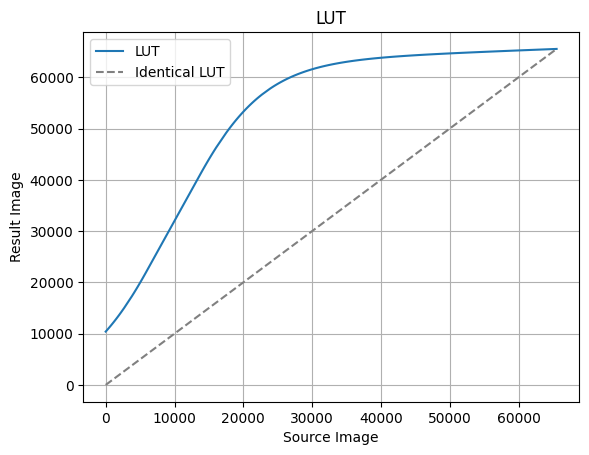

In [22]:
lut_bones = make_lut(span=.4, shift=-0.35, smoothness=0.99, strength=11.5)
show_lut(lut_bones)

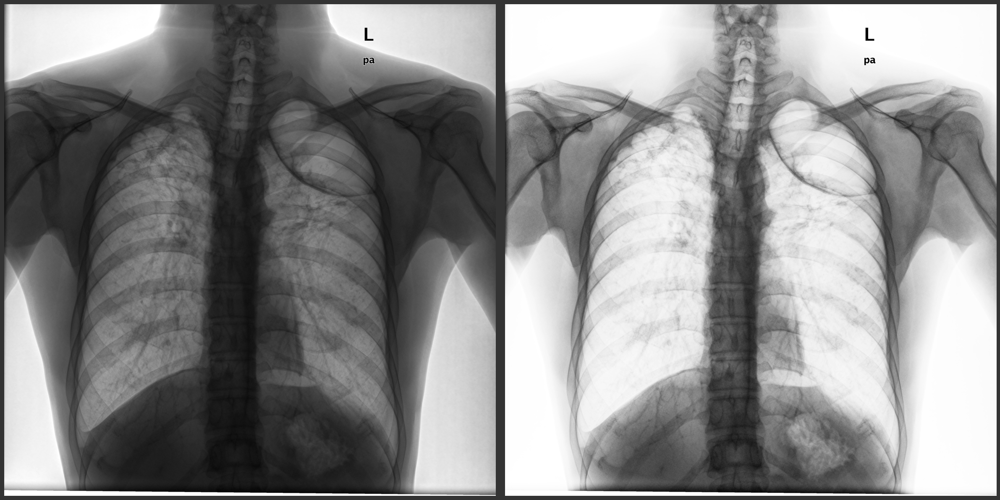

In [23]:
result_img_bones = apply_lut(source_img, lut_bones)

show_images((source_img, result_img_bones), size=12)

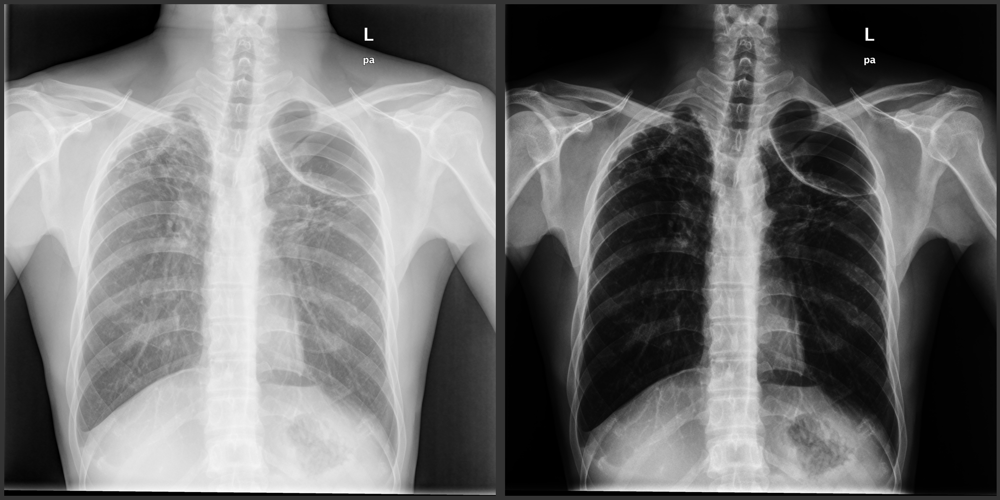

In [24]:
show_images((MAX_INTENSITY - source_img, MAX_INTENSITY - result_img_bones), size=12)
# Инверсия

# Lung

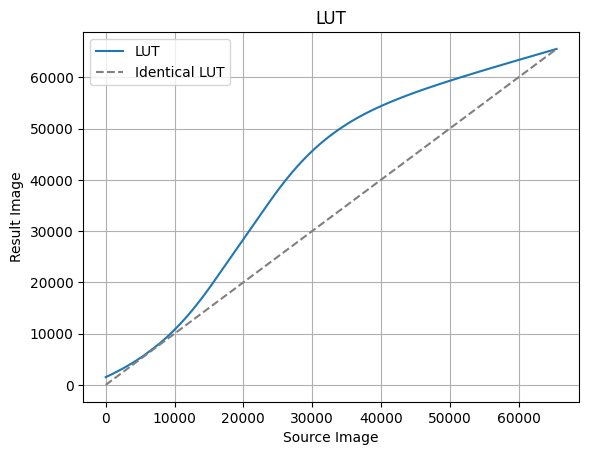

In [25]:
lut_lung = make_lut(span=.4, shift=-0.2, smoothness=0.99, strength=1.)
show_lut(lut_lung)

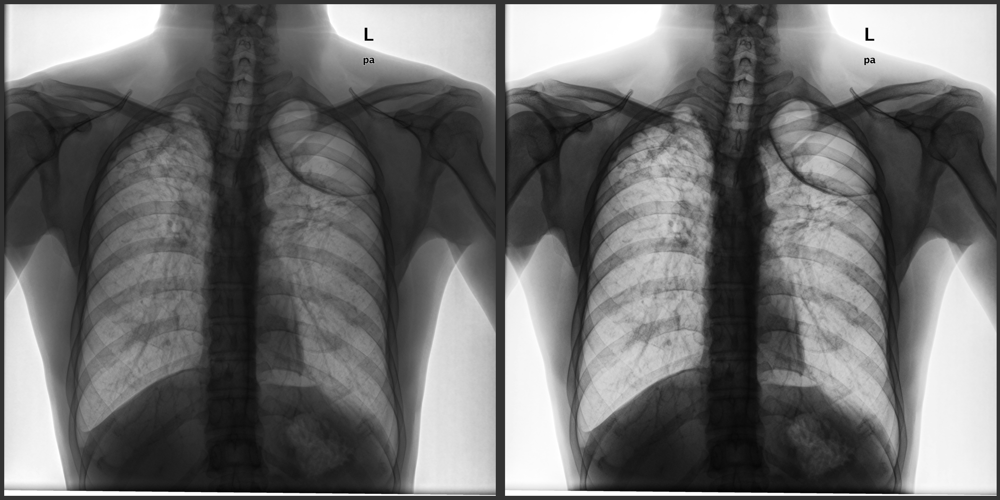

In [26]:
result_img_lung = apply_lut(source_img, lut_lung)
show_images((source_img, result_img_lung), size=12)

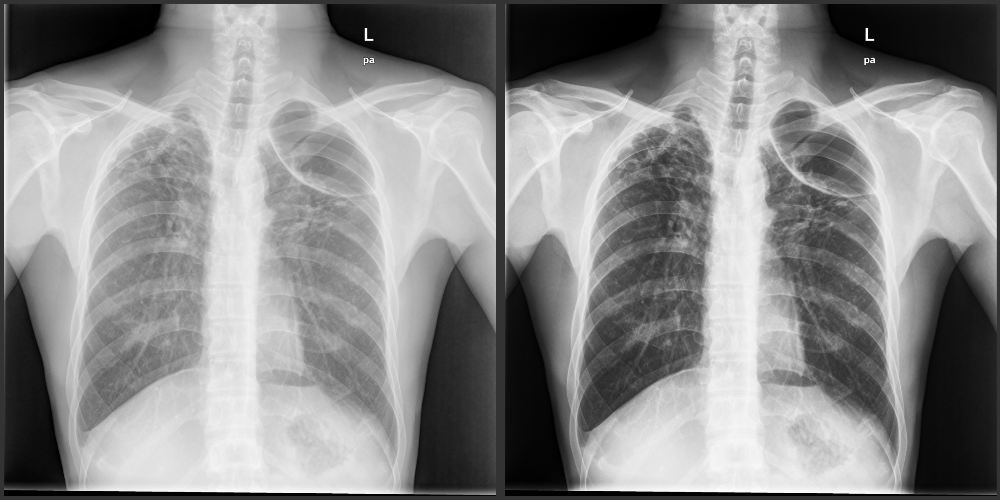

In [27]:
show_images((MAX_INTENSITY - source_img, MAX_INTENSITY - result_img_lung), size=12)
# Инверсия

# Композиция

Возможность генерации различных LUT расширяется благодаря использованию композиции нескольких LUT. Рассмотрим композицию двух LUT:
$$
L_3 = L_1 \circ L_2
$$

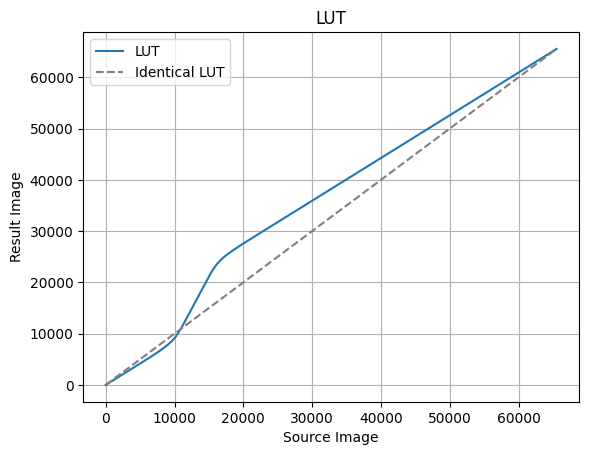

In [29]:
lut_1 = make_lut(span=.1, shift=-0.3, smoothness=0.7, strength=2)
show_lut(lut_1)

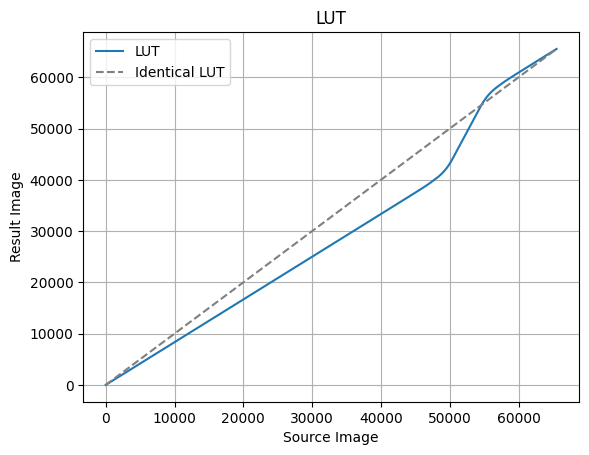

In [30]:
lut_2 = make_lut(span=.1, shift=0.3, smoothness=0.7, strength=2)
show_lut(lut_2)

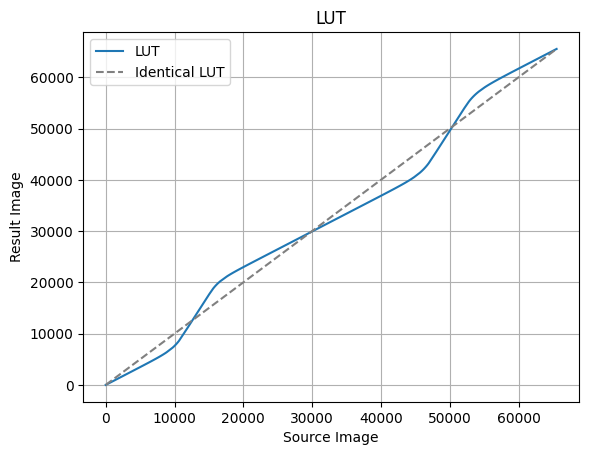

In [31]:
lut_3 = lut_2[lut_1]
show_lut(lut_3)

Композиция с `gamma_lut`:

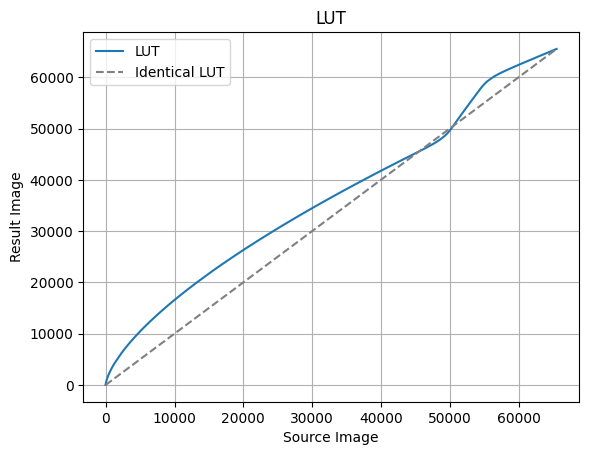

In [32]:
lut_4 = gamma_lut[lut_2]
show_lut(lut_4)

Заметим, что перестановка местами LUT в композиции приводит к различным результатам:

$$
L_1 \circ L_2 \neq L_2 \circ L_1
$$

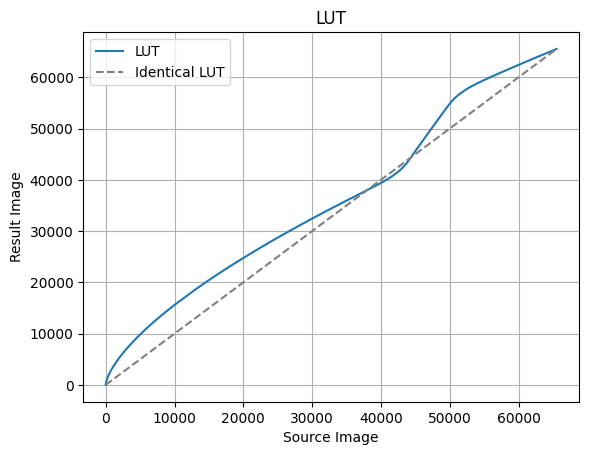

In [33]:
lut_5 = lut_2[gamma_lut]
show_lut(lut_5)